<a href="https://colab.research.google.com/github/Tim-Albiges/Tim-Albiges/blob/main/Copy_of_Loading_SPRSounds_Dataset.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# --- Step 1: Install and Import Libraries ---
!pip install librosa

In [ ]:
# Import the required libraries.
import librosa
import librosa.display
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import os
from google.colab import drive
import warnings
from IPython.display import Audio

In [ ]:
# Suppress warnings that may appear during audio loading.
warnings.filterwarnings('ignore', category=UserWarning, module='librosa')

# --- Step 2: Mount Google Drive ---
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# --- Step 3: Define File Paths ---
# Please ensure this path is correct based on the location of your SPRSound-main directory on Google Drive.
base_path = '/content/drive/MyDrive/Data/SPRSound-main/'
base_path2 = '/content/drive/MyDrive/Data/SPRSound-main/Detection'
patient_summary_path = os.path.join(base_path, 'Patient Summary', 'SPRSound_patient_summary.csv')
audio_path = os.path.join(base_path2, 'train_detection_wav')

In [ ]:
# --- Step 4: Load Patient Summary CSV ---
try:
    df_patient_summary = pd.read_csv(patient_summary_path)
    print("Patient summary DataFrame loaded successfully:")
    print(df_patient_summary.head())
except FileNotFoundError:
    print(f"Error: The patient summary file was not found at {patient_summary_path}")
    print("Please check the path and filename in the code.")
    exit()

Patient summary DataFrame loaded successfully:
   Unnamed: 0  patient_num                 disease  age gender
0           0     65044484  Pneumonia (non-severe)  6.1      F
1           1     64837947              Bronchitis  4.0      F
2           2     65032402  Pneumonia (non-severe)  1.5      F
3           3     40943224  Pneumonia (non-severe)  9.7      M
4           4     64974732  Pneumonia (non-severe)  0.5      F


In [ ]:
# --- Step 5: Load Audio Files and Extract Metadata ---
audio_data_list = []
audio_meta_list = []
sample_rates = []

if os.path.exists(audio_path):
    all_files = os.listdir(audio_path)
    wav_files = [f for f in all_files if f.endswith('.wav')]

    print(f"\nFound {len(wav_files)} audio files to process...")

    for i, filename in enumerate(wav_files):
        full_path = os.path.join(audio_path, filename)

        try:
            # Load the audio file and its sample rate.
            y, sr = librosa.load(full_path, sr=None)
            audio_data_list.append(y)
            sample_rates.append(sr)

            # Extract metadata from the filename as described in the README.md.
            # Filename format: patient_number_age_gender_location_recording_number.wav
            parts = filename.replace('.wav', '').split('_')

            if len(parts) == 5:
                meta_dict = {
                    'patient_number': parts[0],
                    'age': float(parts[1]),
                    'gender': 'Male' if parts[2] == '0' else 'Female',
                    'recording_location': parts[3],
                    'recording_number': parts[4],
                    'audio_data_index': i,  # This index links to the audio data in the list.
                    'filename': filename
                }
                audio_meta_list.append(meta_dict)
            else:
                print(f"Skipping file '{filename}' due to unexpected filename format.")
        except Exception as e:
            print(f"Skipping file '{filename}' due to a loading error: {e}")
            continue

    print("\nAudio file processing complete.")
else:
    print(f"Error: The audio directory was not found at {audio_path}")
    exit()



Found 2660 audio files to process...

Audio file processing complete.


In [ ]:
# --- Step 6: Create and Merge DataFrames ---
# Create a DataFrame from the extracted audio metadata.
df_audio_meta = pd.DataFrame(audio_meta_list)
df_audio_meta.head()

,patient_number,age,gender,recording_location,recording_number,audio_data_index,filename
0,65060531,7.7,Male,p1,749,0,65060531_7.7_0_p1_749.wav
1,65044484,6.1,Female,p1,9,1,65044484_6.1_1_p1_9.wav
2,65045423,5.0,Female,p2,218,2,65045423_5.0_1_p2_218.wav
3,65055195,4.0,Female,p2,1006,3,65055195_4.0_1_p2_1006.wav
4,65049153,0.8,Male,p1,3765,4,65049153_0.8_0_p1_3765.wav


In [ ]:
print(df_patient_summary.patient_num.dtype)
print(df_audio_meta.patient_number.dtype)

int64
object


In [ ]:
df_patient_summary['patient_num'] = df_patient_summary['patient_num'].astype(np.int32)

In [ ]:
# Replace empty strings and problematic values with NaN, then convert to int
df_audio_meta['patient_number'] = pd.to_numeric(df_audio_meta['patient_number'], errors='coerce')

# If you want integer dtype without missing (NaN) values, remove rows with NaN:
df_audio_meta = df_audio_meta.dropna(subset=['patient_number'])
df_audio_meta['patient_number'] = df_audio_meta['patient_number'].astype(np.int32)
df_audio_meta.head()

,patient_number,age,gender,recording_location,recording_number,audio_data_index,filename
0,65060531,7.7,Male,p1,749,0,65060531_7.7_0_p1_749.wav
1,65044484,6.1,Female,p1,9,1,65044484_6.1_1_p1_9.wav
2,65045423,5.0,Female,p2,218,2,65045423_5.0_1_p2_218.wav
3,65055195,4.0,Female,p2,1006,3,65055195_4.0_1_p2_1006.wav
4,65049153,0.8,Male,p1,3765,4,65049153_0.8_0_p1_3765.wav


In [ ]:
df_patient_summary = df_patient_summary.rename(columns={'patient_num': 'patient_number'})

In [ ]:
# Merge the two DataFrames on the 'patient_number' column.
# Using a 'right' merge ensures that we keep all records from the audio metadata.
df_combined = pd.merge(df_patient_summary, df_audio_meta, on='patient_number', how='right')
df_combined.head()

,Unnamed: 0,patient_number,disease,age_x,gender_x,age_y,gender_y,recording_location,recording_number,audio_data_index,filename
0,22.0,65060531,Pneumonia (non-severe),7.7,M,7.7,Male,p1,749,0,65060531_7.7_0_p1_749.wav
1,0.0,65044484,Pneumonia (non-severe),6.1,F,6.1,Female,p1,9,1,65044484_6.1_1_p1_9.wav
2,154.0,65045423,Pneumonia (non-severe),5.2,F,5.0,Female,p2,218,2,65045423_5.0_1_p2_218.wav
3,166.0,65055195,Pneumonia (non-severe),4.0,F,4.0,Female,p2,1006,3,65055195_4.0_1_p2_1006.wav
4,80.0,65049153,Other respiratory diseases,0.8,M,0.8,Male,p1,3765,4,65049153_0.8_0_p1_3765.wav


In [ ]:
# --- Step 7: Final Output ---
# Display the final combined DataFrame to show all the metadata in one place.
print("\nFinal combined DataFrame with patient summary and audio metadata:")
print(df_combined.head())
print("\nDataFrame Shape:", df_combined.shape)


Final combined DataFrame with patient summary and audio metadata:
   Unnamed: 0  patient_number                     disease  age_x gender_x  \
0        22.0        65060531      Pneumonia (non-severe)    7.7        M   
1         0.0        65044484      Pneumonia (non-severe)    6.1        F   
2       154.0        65045423      Pneumonia (non-severe)    5.2        F   
3       166.0        65055195      Pneumonia (non-severe)    4.0        F   
4        80.0        65049153  Other respiratory diseases    0.8        M   

   age_y gender_y recording_location recording_number  audio_data_index  \
0    7.7     Male                 p1              749                 0   
1    6.1   Female                 p1                9                 1   
2    5.0   Female                 p2              218                 2   
3    4.0   Female                 p2             1006                 3   
4    0.8     Male                 p1             3765                 4   

                   

In [ ]:
Audio(audio_data_list[2][250:], rate=sample_rates[2])

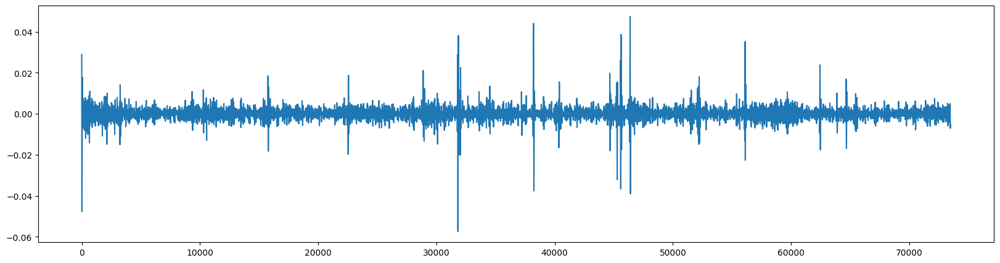

In [ ]:
plt.figure(figsize=(20,5))
plt.plot(audio_data_list[2][250:])
plt.show()

In [ ]:
# You can now access the audio data for each row in the DataFrame using the 'audio_data_index'.
# For example, to get the audio data for the first row:
# first_audio_data = audio_data_list[df_combined.loc[0, 'audio_data_index']]
# print("\nShape of the audio data for the first sample:", first_audio_data.shape)

# Gaussian Mixture Model VAE with Attention mechanism


In [ ]:
# Note: Ensure these libraries are imported in your notebook.
# Most are already there, but tqdm is new for the progress bar.
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch.utils.data import DataLoader, Dataset
import seaborn as sns
from sklearn.manifold import TSNE
from tqdm import tqdm

# Set a seed for reproducibility
torch.manual_seed(42)
np.random.seed(42)

In [ ]:
# --- Step 8: Define the PyTorch Dataset for SPRSound Data ---
# This class will wrap your existing audio_data_list and df_combined.

class SPRSoundDataset(Dataset):
    """
    A PyTorch Dataset for the pre-loaded SPRSound audio data.
    It handles padding/truncating audio to a fixed length.
    """
    def __init__(self, df, audio_list, target_length=20000):
        self.df = df.reset_index(drop=True) # Ensure index is clean
        self.audio_list = audio_list
        self.target_length = target_length

        # Create mappings for categorical labels from your dataframe
        self.disease_map = {label: i for i, label in enumerate(df['disease'].unique())}
        self.gender_map = {label: i for i, label in enumerate(df['gender_x'].unique())}

        self.num_diseases = len(self.disease_map)
        self.num_genders = len(self.gender_map)
        self.condition_dim = self.num_diseases + self.num_genders + 1 # +1 for age

    def __len__(self):
        return len(self.df)

    def _pad_or_truncate(self, audio):
        """Pads or truncates the audio to the target length."""
        if len(audio) > self.target_length:
            # Truncate from the center
            start = (len(audio) - self.target_length) // 2
            audio = audio[start : start + self.target_length]
        elif len(audio) < self.target_length:
            # Pad with zeros on both sides
            padding = self.target_length - len(audio)
            pad_left = padding // 2
            pad_right = padding - pad_left
            audio = np.pad(audio, (pad_left, pad_right), 'constant')
        return torch.tensor(audio, dtype=torch.float32).unsqueeze(0) # Add channel dim

    def _get_condition_vector(self, row):
        """Converts a dataframe row into a one-hot encoded condition tensor."""
        # Age (normalized) - using age_x from your dataframe
        age_tensor = torch.tensor([row['age_x'] / 80.0], dtype=torch.float32)

        # Disease (one-hot)
        disease_idx = self.disease_map[row['disease']]
        disease_tensor = F.one_hot(torch.tensor(disease_idx), num_classes=self.num_diseases).float()

        # Gender (one-hot) - using gender_x from your dataframe
        gender_idx = self.gender_map[row['gender_x']]
        gender_tensor = F.one_hot(torch.tensor(gender_idx), num_classes=self.num_genders).float()

        return torch.cat([age_tensor, disease_tensor, gender_tensor])

    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        audio_index = int(row['audio_data_index'])
        raw_audio = self.audio_list[audio_index][-20000:]

        processed_audio = self._pad_or_truncate(raw_audio)
        condition_vec = self._get_condition_vector(row)

        return processed_audio, condition_vec



In [ ]:
# --- Step 9: Define the GMVAE Model Architecture ---
# This is the same model architecture as before, ready to be used.

class AttentionEncoder(nn.Module):
    def __init__(self, hidden_dim, latent_dim, n_components, condition_dim):
        super().__init__()
        self.cnn = nn.Sequential(
            nn.Conv1d(1, 16, kernel_size=8, stride=4, padding=2),
            nn.ReLU(), nn.MaxPool1d(2),
            nn.Conv1d(16, 32, kernel_size=8, stride=4, padding=2),
            nn.ReLU(), nn.MaxPool1d(5),
        )
        self.cnn_out_dim = 32
        self.key = nn.Linear(self.cnn_out_dim, hidden_dim)
        self.query = nn.Linear(self.cnn_out_dim, hidden_dim)
        self.value = nn.Linear(self.cnn_out_dim, self.cnn_out_dim)
        self.fc1 = nn.Linear(self.cnn_out_dim + condition_dim, hidden_dim)
        self.fc2 = nn.Linear(hidden_dim, hidden_dim)
        self.fc_mu = nn.Linear(hidden_dim, latent_dim)
        self.fc_logvar = nn.Linear(hidden_dim, latent_dim)
        self.fc_pi = nn.Linear(hidden_dim, n_components)

    def forward(self, x, c):
        features = self.cnn(x).transpose(1, 2)
        k, q, v = self.key(features), self.query(features), self.value(features)
        scores = torch.matmul(q, k.transpose(-2, -1)) / np.sqrt(self.cnn_out_dim)
        attention_weights = F.softmax(scores, dim=-1)
        attended = torch.matmul(attention_weights, v)
        context = attended.mean(dim=1)
        context_with_c = torch.cat([context, c], dim=1)
        h = F.relu(self.fc1(context_with_c))
        h = F.relu(self.fc2(h))
        mu, logvar, pi_logits = self.fc_mu(h), self.fc_logvar(h), self.fc_pi(h)
        return mu, logvar, pi_logits, attention_weights

class Decoder(nn.Module):
    def __init__(self, latent_dim, hidden_dim, condition_dim):
        super().__init__()
        self.fc1 = nn.Linear(latent_dim + condition_dim, hidden_dim)
        self.fc2 = nn.Linear(hidden_dim, 32 * 125)
        # Re-architected the deconvolutional layers for more stability
        self.deconv = nn.Sequential(
            nn.ConvTranspose1d(32, 16, kernel_size=4, stride=4), nn.ReLU(), # -> (16, 500)
            nn.ConvTranspose1d(16, 8, kernel_size=4, stride=4), nn.ReLU(),  # -> (8, 2000)
            nn.ConvTranspose1d(8, 1, kernel_size=10, stride=10)             # -> (1, 20000)
        )

    def forward(self, z, c):
        z_with_c = torch.cat([z, c], dim=1)
        h = F.relu(self.fc1(z_with_c))
        h = F.relu(self.fc2(h)).view(-1, 32, 125)
        return self.deconv(h)

class C_GMVAE(nn.Module):
    def __init__(self, hidden_dim, latent_dim, n_components, condition_dim):
        super().__init__()
        self.encoder = AttentionEncoder(hidden_dim, latent_dim, n_components, condition_dim)
        self.decoder = Decoder(latent_dim, hidden_dim, condition_dim)
        self.n_components = n_components
        self.prior_mu = nn.Parameter(torch.randn(n_components, latent_dim))
        self.prior_logvar = nn.Parameter(torch.zeros(n_components, latent_dim))

    def reparameterize(self, mu, logvar):
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        return mu + eps * std

    def forward(self, x, c):
        mu, logvar, pi_logits, attention_weights = self.encoder(x, c)
        z = self.reparameterize(mu, logvar)
        x_recon = self.decoder(z, c)
        q_c_given_x = F.softmax(pi_logits, dim=-1)
        return x_recon, mu, logvar, q_c_given_x, attention_weights

    def loss_function(self, x, x_recon, mu, logvar, q_c_given_x):
        recon_loss = F.mse_loss(x_recon, x, reduction='sum')
        kl_div = 0
        for i in range(self.n_components):
            prior_mu_c, prior_logvar_c = self.prior_mu[i], self.prior_logvar[i]
            kl_z = 0.5 * torch.sum(prior_logvar_c - logvar + \
                (torch.exp(logvar) + (mu - prior_mu_c)**2) / torch.exp(prior_logvar_c) - 1, dim=-1)
            kl_c = torch.log(q_c_given_x[:, i] + 1e-10) - np.log(1.0/self.n_components)
            kl_div += (q_c_given_x[:, i] * (kl_z + kl_c)).sum()
        return recon_loss + kl_div

In [ ]:
# --- Step 10: Define Visualization Functions ---

def plot_attention_weights(audio_sample, attention_weights, cnn_downsample_factor=160):
    audio_sample = audio_sample.squeeze().cpu().numpy()
    avg_weights = attention_weights.squeeze().mean(dim=0).cpu().detach().numpy()
    upsampled_weights = np.repeat(avg_weights, cnn_downsample_factor)
    upsampled_weights = np.pad(upsampled_weights, (0, len(audio_sample) - len(upsampled_weights)), 'edge')
    time_axis = np.linspace(0, 5, len(audio_sample))
    fig, ax1 = plt.subplots(figsize=(15, 5))
    ax1.set_title("Attention Weights Overlaid on Audio Signal")
    ax1.plot(time_axis, audio_sample, color='cornflowerblue', label='Audio Signal', alpha=0.8)
    ax1.set_xlabel("Time (s)")
    ax1.set_ylabel("Amplitude", color='cornflowerblue')
    ax2 = ax1.twinx()
    ax2.plot(time_axis, upsampled_weights, color='crimson', label='Attention Score', alpha=0.6)
    ax2.set_ylabel("Attention Score", color='crimson')
    fig.tight_layout()
    plt.show()

def plot_latent_space(model, dataloader, df, device):
    model.eval()
    latents = []
    with torch.no_grad():
        for audio, cond in tqdm(dataloader, desc="Generating Latent Embeddings"):
            audio, cond = audio.to(device), cond.to(device)
            mu, _, _, _ = model.encoder(audio, cond)
            latents.append(mu.cpu().numpy())
    latents = np.concatenate(latents, axis=0)
    tsne = TSNE(n_components=2, perplexity=30, n_iter=350, random_state=42)
    latents_2d = tsne.fit_transform(latents)

    fig, axs = plt.subplots(1, 3, figsize=(24, 7))
    fig.suptitle('Latent Space Visualized by Different Labels (t-SNE)', fontsize=16)

    # Use the exact column names from your df_combined
    sns.scatterplot(x=latents_2d[:, 0], y=latents_2d[:, 1], hue=df['disease'], palette='viridis', ax=axs[0], alpha=0.8).set_title('Colored by Disease')
    sns.scatterplot(x=latents_2d[:, 0], y=latents_2d[:, 1], hue=df['age_x'], palette='plasma', ax=axs[1], alpha=0.8).set_title('Colored by Age')
    sns.scatterplot(x=latents_2d[:, 0], y=latents_2d[:, 1], hue=df['gender_x'], palette='coolwarm', ax=axs[2], alpha=0.8).set_title('Colored by Gender')

    for ax in axs:
        ax.set_xlabel('t-SNE Dimension 1'); ax.set_ylabel('t-SNE Dimension 2')
        ax.legend(loc='upper right'); ax.grid(True, linestyle='--', alpha=0.6)
    plt.tight_layout(rect=[0, 0.03, 1, 0.95]); plt.show()



In [ ]:
# --- Step 11: Main Training and Execution Cell ---
# --- Hyperparameters ---
SEQ_LEN = 20000 # 5s @ 4000Hz
HIDDEN_DIM = 128
LATENT_DIM = 16
N_COMPONENTS = 5
BATCH_SIZE = 32
EPOCHS = 30 # Increased for better convergence on real data
LR = 1e-4 # Lowered learning rate for more stable training

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

Using device: cpu


In [ ]:
# --- Data ---
# df_combined and audio_data_list should already be loaded in your notebook
# We need to drop rows with missing labels before creating the dataset
df_clean = df_combined.dropna(subset=['disease', 'age_x', 'gender_x', 'audio_data_index']).copy()

dataset = SPRSoundDataset(df_clean, audio_data_list, target_length=SEQ_LEN)
dataloader = DataLoader(dataset, batch_size=BATCH_SIZE, shuffle=True)

In [ ]:
# --- Model ---
model = C_GMVAE(
    hidden_dim=HIDDEN_DIM,
    latent_dim=LATENT_DIM,
    n_components=N_COMPONENTS,
    condition_dim=dataset.condition_dim
).to(device)

optimizer = optim.Adam(model.parameters(), lr=LR)

In [ ]:
# --- Training Loop ---
print("Starting GMVAE training...")
model.train()
for epoch in range(EPOCHS):
    total_loss = 0
    progress_bar = tqdm(dataloader, desc=f"Epoch {epoch+1}/{EPOCHS}")
    for audio, cond in progress_bar:
        audio, cond = audio.to(device), cond.to(device)
        optimizer.zero_grad()
        x_recon, mu, logvar, q_c, _ = model(audio, cond)
        loss = model.loss_function(audio, x_recon, mu, logvar, q_c)
        loss.backward()
        optimizer.step()
        total_loss += loss.item()
        progress_bar.set_postfix(loss=loss.item() / len(audio))

    avg_loss = total_loss / len(dataset)
    print(f"Epoch {epoch+1}/{EPOCHS} - Average Loss: {avg_loss:.4f}")

print("\nTraining finished!")

Starting GMVAE training...


Epoch 1/30: 100%|██████████| 63/63 [00:13<00:00,  4.72it/s, loss=496]


Epoch 1/30 - Average Loss: 546.8852


Epoch 2/30: 100%|██████████| 63/63 [00:10<00:00,  6.27it/s, loss=294]


Epoch 2/30 - Average Loss: 421.5747


Epoch 3/30: 100%|██████████| 63/63 [00:10<00:00,  5.75it/s, loss=132]


Epoch 3/30 - Average Loss: 199.6231


Epoch 4/30: 100%|██████████| 63/63 [00:11<00:00,  5.46it/s, loss=68.6]


Epoch 4/30 - Average Loss: 101.2639


Epoch 5/30: 100%|██████████| 63/63 [00:10<00:00,  5.79it/s, loss=36.9]


Epoch 5/30 - Average Loss: 57.0292


Epoch 6/30: 100%|██████████| 63/63 [00:09<00:00,  6.44it/s, loss=31.3]


Epoch 6/30 - Average Loss: 36.0908


Epoch 7/30: 100%|██████████| 63/63 [00:11<00:00,  5.53it/s, loss=19.1]


Epoch 7/30 - Average Loss: 26.3907


Epoch 8/30: 100%|██████████| 63/63 [00:11<00:00,  5.49it/s, loss=16.9]


Epoch 8/30 - Average Loss: 19.4949


Epoch 9/30: 100%|██████████| 63/63 [00:09<00:00,  6.89it/s, loss=17.5]


Epoch 9/30 - Average Loss: 15.1522


Epoch 10/30: 100%|██████████| 63/63 [00:11<00:00,  5.51it/s, loss=9.75]


Epoch 10/30 - Average Loss: 12.8147


Epoch 11/30: 100%|██████████| 63/63 [00:11<00:00,  5.52it/s, loss=8.55]


Epoch 11/30 - Average Loss: 11.6116


Epoch 12/30: 100%|██████████| 63/63 [00:09<00:00,  6.36it/s, loss=5.89]


Epoch 12/30 - Average Loss: 10.4863


Epoch 13/30: 100%|██████████| 63/63 [00:10<00:00,  5.79it/s, loss=9.83]


Epoch 13/30 - Average Loss: 9.8183


Epoch 14/30: 100%|██████████| 63/63 [00:11<00:00,  5.50it/s, loss=6.66]


Epoch 14/30 - Average Loss: 9.2371


Epoch 15/30: 100%|██████████| 63/63 [00:11<00:00,  5.65it/s, loss=6.41]


Epoch 15/30 - Average Loss: 8.7641


Epoch 16/30: 100%|██████████| 63/63 [00:09<00:00,  6.52it/s, loss=8.21]


Epoch 16/30 - Average Loss: 8.4007


Epoch 17/30: 100%|██████████| 63/63 [00:11<00:00,  5.51it/s, loss=5.88]


Epoch 17/30 - Average Loss: 8.1077


Epoch 18/30: 100%|██████████| 63/63 [00:11<00:00,  5.54it/s, loss=4.54]


Epoch 18/30 - Average Loss: 7.9268


Epoch 19/30: 100%|██████████| 63/63 [00:09<00:00,  6.65it/s, loss=5.57]


Epoch 19/30 - Average Loss: 7.7559


Epoch 20/30: 100%|██████████| 63/63 [00:11<00:00,  5.58it/s, loss=4.49]


Epoch 20/30 - Average Loss: 7.4746


Epoch 21/30: 100%|██████████| 63/63 [00:11<00:00,  5.41it/s, loss=6.79]


Epoch 21/30 - Average Loss: 7.3504


Epoch 22/30: 100%|██████████| 63/63 [00:10<00:00,  5.90it/s, loss=20.6]


Epoch 22/30 - Average Loss: 7.2857


Epoch 23/30: 100%|██████████| 63/63 [00:09<00:00,  6.33it/s, loss=5.16]


Epoch 23/30 - Average Loss: 7.0676


Epoch 24/30: 100%|██████████| 63/63 [00:11<00:00,  5.39it/s, loss=3.59]


Epoch 24/30 - Average Loss: 6.9576


Epoch 25/30: 100%|██████████| 63/63 [00:11<00:00,  5.50it/s, loss=5.14]


Epoch 25/30 - Average Loss: 6.7449


Epoch 26/30: 100%|██████████| 63/63 [00:09<00:00,  6.81it/s, loss=6.02]


Epoch 26/30 - Average Loss: 6.5732


Epoch 27/30: 100%|██████████| 63/63 [00:11<00:00,  5.47it/s, loss=7.53]


Epoch 27/30 - Average Loss: 6.4596


Epoch 28/30: 100%|██████████| 63/63 [00:11<00:00,  5.49it/s, loss=3.34]


Epoch 28/30 - Average Loss: 6.2988


Epoch 29/30: 100%|██████████| 63/63 [00:10<00:00,  6.24it/s, loss=3.63]


Epoch 29/30 - Average Loss: 6.1868


Epoch 30/30: 100%|██████████| 63/63 [00:10<00:00,  5.89it/s, loss=3.35]

Epoch 30/30 - Average Loss: 6.0342

Training finished!


#Save Model

In [ ]:
# Define a path to save the model
MODEL_SAVE_PATH = '/content/drive/MyDrive/Data/SPRSound-main/Models/atten_gmvae_model_!.pth'

# Save the model's state dictionary
torch.save(model.state_dict(), MODEL_SAVE_PATH)

print(f"Model saved to {MODEL_SAVE_PATH}")

Model saved to /content/drive/MyDrive/Data/SPRSound-main/Models/atten_gmvae_model_!.pth


#Load the model

In [ ]:
load = False
# --- 1. Re-create the model instance ---
# You must first have an instance of the C_GMVAE class with the same parameters.
# Make sure the hyperparameters match the ones used for the saved model.
if load == True:
    # (Assuming these variables are defined as they were during training)
    loaded_model = C_GMVAE(
        hidden_dim=HIDDEN_DIM,
        latent_dim=LATENT_DIM,
        n_components=N_COMPONENTS,
        condition_dim=dataset.condition_dim
    ).to(device)


    # --- 2. Load the saved state_dict ---
    loaded_model.load_state_dict(torch.load(MODEL_SAVE_PATH))


    # --- 3. Set the model to evaluation mode ---
    # This is crucial as it disables layers like Dropout or BatchNorm if you have them.
    loaded_model.eval()

    print("Model loaded successfully and set to evaluation mode.")

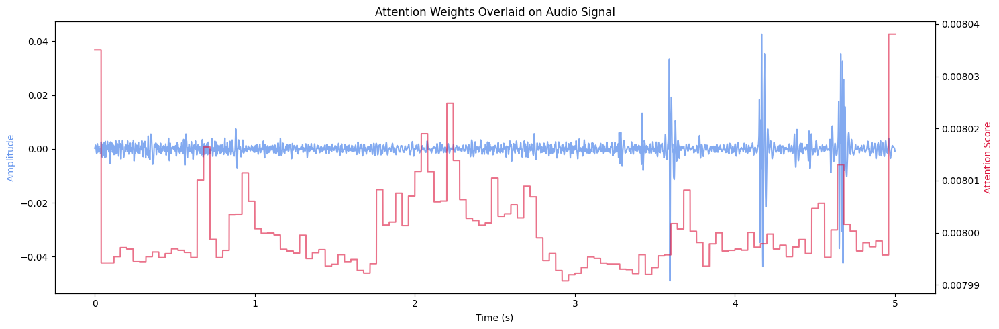

In [ ]:
# --- Visualization ---
# 1. Plot attention for a single sample
model.eval()
with torch.no_grad():
    sample_audio, sample_cond = next(iter(dataloader))
    sample_audio, sample_cond = sample_audio.to(device), sample_cond.to(device)
    _, _, _, _, attention_weights = model(sample_audio, sample_cond)

plot_attention_weights(sample_audio[1], attention_weights[0], cnn_downsample_factor=160)

Generating Latent Embeddings: 100%|██████████| 63/63 [00:02<00:00, 31.07it/s]
/usr/local/lib/python3.12/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


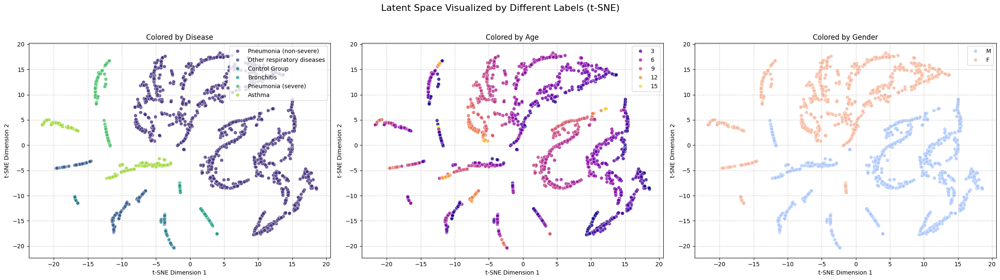

In [ ]:
# 2. Plot the latent space
# Use a non-shuffled dataloader to ensure alignment with the dataframe for plotting
viz_dataloader = DataLoader(dataset, batch_size=BATCH_SIZE, shuffle=False)
plot_latent_space(model, viz_dataloader, df_clean, device)

In [ ]:
def sonify_latent_space(model, dataloader, df, device, sample_rate=22050, duration_per_point=0.1):
    """Generates an audio representation of the t-SNE latent space."""
    print("Generating latent space sonification...")
    model.eval()
    latents = []
    with torch.no_grad():
        for audio, cond in dataloader: # No tqdm here to keep output clean
            audio, cond = audio.to(device), cond.to(device)
            mu, _, _, _ = model.encoder(audio, cond)
            latents.append(mu.cpu().numpy())
    latents = np.concatenate(latents, axis=0)
    tsne = TSNE(n_components=2, perplexity=30, n_iter=350, random_state=42)
    latents_2d = tsne.fit_transform(latents)

    # Normalize coordinates to [0, 1] for mapping
    x_coords = (latents_2d[:, 0] - latents_2d[:, 0].min()) / (latents_2d[:, 0].max() - latents_2d[:, 0].min())
    y_coords = (latents_2d[:, 1] - latents_2d[:, 1].min()) / (latents_2d[:, 1].max() - latents_2d[:, 1].min())

    # Get disease labels for timbre mapping
    # --- FIX: Convert to NumPy array to avoid KeyError with non-continuous indices ---
    disease_labels = df['disease'].astype('category').cat.codes.to_numpy()

    # Define sound properties
    min_freq, max_freq = 220.0, 880.0 # A2 to A5 notes

    # Generate audio
    full_audio = []
    num_samples_per_point = int(sample_rate * duration_per_point)
    t = np.linspace(0., duration_per_point, num_samples_per_point, endpoint=False)

    # Sort points by x-coordinate to sweep frequency left-to-right
    sorted_indices = np.argsort(x_coords)

    for i in tqdm(sorted_indices, desc="Synthesizing Audio"):
        freq = x_coords[i] * (max_freq - min_freq) + min_freq
        amp = y_coords[i] * 0.8 + 0.1 # Avoid silence and clipping
        disease_code = disease_labels[i]

        # Map disease to waveform
        if disease_code == 0: # Sine wave
            wave = np.sin(2. * np.pi * freq * t)
        elif disease_code == 1: # Square wave
            wave = np.sign(np.sin(2. * np.pi * freq * t))
        else: # Sawtooth wave
            wave = 2 * (t * freq - np.floor(0.5 + t * freq))

        # Apply a simple fade in/out to avoid clicks
        fade_len = int(sample_rate * 0.01)
        fade_in = np.linspace(0, 1, fade_len)
        fade_out = np.linspace(1, 0, fade_len)
        wave[:fade_len] *= fade_in
        wave[-fade_len:] *= fade_out

        full_audio.append(wave * amp)

    final_wave = np.concatenate(full_audio)

    print("Sonification complete. Displaying audio player.")
    return Audio(final_wave, rate=sample_rate)


In [ ]:
sonification_audio = sonify_latent_space(model, viz_dataloader, df_clean, device)
sonification_audio # Display the audio player

Generating latent space sonification...


/usr/local/lib/python3.12/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
Synthesizing Audio: 100%|██████████| 1988/1988 [00:00<00:00, 24393.84it/s]

Sonification complete. Displaying audio player.
